2025-05-08 14:17:03,742 Timor INFO Loading custom configurations from /home/mscsim/.config/timor.config
2025-05-08 14:17:04,626 Timor INFO Getting robot modrob-gen2.
2025-05-08 14:17:04,627 Timor WARNING Could not fetch robot modrob-gen2 due to [Errno 17] File exists: '/home/mscsim/anaconda3/envs/timor-env/lib/python3.10/site-packages/cache/robots/modrob-gen2'.


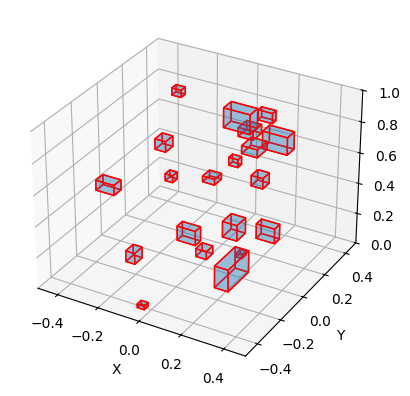

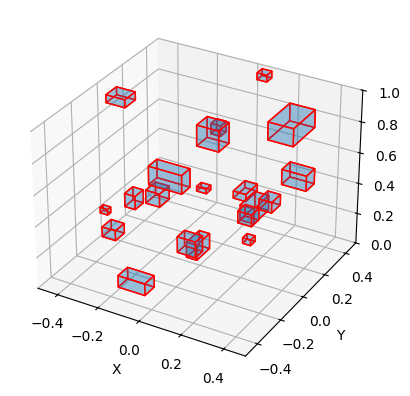

In [1]:
import numpy as np
import timor
import argparse
import pygad
import os
from util import *
from timor.Module import *
from timor.utilities.visualization import animation
# import matplotlib.pyplot as plt
# import itertools
# from mpl_toolkits.mplot3d import Axes3D
from tqdm import tqdm
from timor import ModuleAssembly, ModulesDB
from timor.Bodies import Body, Connector, Gender
from timor.configuration_search.GA import GA
from timor.utilities.visualization import MeshcatVisualizer, clear_visualizer
from timor.utilities.dtypes import Lexicographic
from timor.utilities.transformation import Transformation
from timor.utilities.spatial import rotX, rotY, rotZ
from timor.Module import AtomicModule, ModulesDB, ModuleHeader
from timor.Joints import Joint
from timor.Geometry import Box, ComposedGeometry, Cylinder, Sphere, Mesh

from timor_ga import *
from reachability import Reachability
from generate_module import create_i_links, create_eef, create_revolute_joint, base, generate_i_links

In [2]:
how_many_times_to_split_angle_range = 30
world_resolution = 0.01
world_dimension = [1.00, 1.00, 1.00]
num_threads = 5
our_hyperparameters = {
    'population_size': 30,
    'num_generations': 100,
    'num_genes': 9,
    'save_solutions_dir': None
}

In [3]:
r_430_joint = create_revolute_joint("assets/430_joint/430_joint/urdf/430_joint.urdf")
r_330_joint = create_revolute_joint("assets/330_joint/330_joint/urdf/330_joint.urdf")
r_540_joint = create_revolute_joint("assets/540_joint/540_joint/urdf/540_joint.zip.urdf")
r_540_base = create_revolute_joint("assets/540_base/540_base/urdf/540_base.urdf")
# Links
# baseto4310_links = create_i_links(rod_name="baseto4310")
# r4310to4305_links = create_i_links(rod_name="r4310to4305")
# r4310to4310_links = create_i_links(rod_name="r4310to4310")

baseto330_1_links = create_i_links(rod_name="baseto330_1")
baseto330_2_links = create_i_links(rod_name="baseto330_2")
baseto430_2_links = create_i_links(rod_name="baseto430_2")
default_links = create_i_links(rod_name="default")
test_links = create_i_links(rod_name="test")
generated_links = generate_i_links(r_540_base, [r_330_joint, r_430_joint, r_540_joint])
#print(generated_links.all_module_ids)

eef = create_eef()

# Create database
db = ModulesDB()
db.add(r_330_joint)
db.add(r_430_joint)
db.add(r_540_joint)
db.add(r_540_base)

#db = db.union(baseto4310_links)
db = db.union(baseto330_2_links)
db = db.union(baseto430_2_links)
# db = db.union(default_links)
db = db.union(test_links)
db = db.union(generated_links)

db = db.union(eef)
viz = db.debug_visualization()

distal mass 0.0695894991340385
proximal mass 0.76336619255
distal mass 0.0862232846596265
proximal mass 0.337035
distal mass 0.08229669825099249
proximal mass 1.4514717666999999
distal mass 0.08229500000000001
proximal mass 1.7520908237
You can open the visualizer by visiting the following URL:
http://127.0.0.1:7001/static/


In [4]:
print(db.all_module_ids)

{'430_joint-to-330_joint-0.15-1-W', '540_joint-to-430_joint-0.1-2-N', '330_joint-to-330_joint-0.2-0-E', '330_joint-to-430_joint-0.15-0-E', '330_joint-to-330_joint-0.15-3-W', '330_joint-to-330_joint-0.2-3-E', '430_joint-to-540_joint-0.1-2-W', '540_joint-to-330_joint-0.15-0-E', '540_joint-to-540_joint-0.15-0-N', '540_joint-to-540_joint-0.1-1-W', '430_joint-to-330_joint-0.1-3-S', '330_joint-to-330_joint-0.1-2-N', '430_joint-to-540_joint-0.1-1-W', '430_joint-to-330_joint-0.2-3-E', '330_joint-to-430_joint-0.15-1-E', '430_joint-to-540_joint-0.2-2-E', '430_joint-to-540_joint-0.2-3-W', '330_joint-to-430_joint-0.2-2-E', '330_joint-to-430_joint-0.2-3-E', '540_base-to-330_joint-0.1-0-E', '330_joint-to-430_joint-0.15-3-E', '540_joint-to-430_joint-0.2-3-S', '540_joint-to-330_joint-0.15-3-E', '540_joint-to-540_joint-0.1-2-S', '540_joint-to-330_joint-0.1-2-S', '330_joint-to-330_joint-0.1-3-E', '540_joint-to-430_joint-0.3-0-N', '540_base-to-540_joint-0.15-0-N', '540_joint-to-330_joint-0.1-2-E', '330_j

In [5]:

#modules = ('base_rev_joint', 'baseto4310-0.15', 'motor4310_rev_joint', 'r4310to4310-0.3', 'motor4310_rev_joint', 'r4310to4310-0.15', 'motor4310_rev_joint', 'r4310to4310-0.45', 'motor4310_rev_joint', 'r4310to4310-0.15', 'motor4310_rev_joint', 'r4310to4310-0.3', 'motor4310_rev_joint', 'eef')
#modules = ('540_base','baseto330_1-0.3', '330_joint', 'test-0.3', '330_joint', 'test-0.3', '330_joint')

#modules = ('540_base','540_base-to-330_joint-0.45-0-E', '330_joint', '330_joint-to-330_joint-0.45-3-W', '330_joint',  '330_joint-to-330_joint-0.15-3-N', '330_joint')
modules = ('540_base','540_base-to-540_joint-0.45-0-E', '540_joint', '540_joint-to-540_joint-0.15-0-E')#, '430_joint-to-330_joint-0.45-3-N', '330_joint',  '330_joint-to-540_joint-0.15-3-N', '540_joint')
modules = ('540_base', '540_base-to-330_joint-0.3-1-S', '330_joint', '330_joint-to-540_joint-0.3-1-N', '540_joint', '540_joint-to-330_joint-0.15-0-S', '330_joint', '330_joint-to-540_joint-0.45-1-E', '540_joint', '540_joint-to-330_joint-0.15-1-N', '330_joint', '330_joint-to-330_joint-0.3-1-S', '330_joint', '330_joint-to-330_joint-0.3-1-E', '330_joint', 'eef')
modules = ('540_base','540_base-to-330_joint-0.15-0-E', '330_joint', '330_joint-to-330_joint-0.2-3-W', '330_joint',  '330_joint-to-330_joint-0.15-3-N', '330_joint', 'eef')

#modules = ('540_base', '540_base-to-540_joint-0.15-0-S', '540_joint', '540_joint-to-540_joint-0.15-3-S', '540_joint', '540_joint-to-540_joint-0.3-0-W', '540_joint', '540_joint-to-330_joint-0.15-1-W', '330_joint', '330_joint-to-330_joint-0.15-1-N', '330_joint', '330_joint-to-330_joint-0.3-1-S', '330_joint', '330_joint-to-330_joint-0.15-0-W', '330_joint', 'eef')
#modules = ('540_base', '540_base-to-430_joint-0.1-0-E', '430_joint', '430_joint-to-330_joint-0.1-0-E', '330_joint', '330_joint-to-540_joint-0.2-0-E', '540_joint', '540_joint-to-430_joint-0.2-0-S', '430_joint', '430_joint-to-430_joint-0.15-2-E', '430_joint', '430_joint-to-330_joint-0.3-0-W','eef')

#modules = ('540_base','540_base-to-540_joint-0.15-1-W', '540_joint')
modules = ('540_base', '540_base-to-430_joint-0.2-1-E', '430_joint', '430_joint-to-430_joint-0.1-0-E', '430_joint', '430_joint-to-430_joint-0.15-0-W', '430_joint', '430_joint-to-330_joint-0.3-0-W', '330_joint', '330_joint-to-330_joint-0.3-3-N', '330_joint', '330_joint-to-430_joint-0.15-1-S', 'eef')
modules = ('540_base', '540_base-to-430_joint-0.1-0-W', '430_joint', '430_joint-to-430_joint-0.1-0-S', '430_joint', '430_joint-to-330_joint-0.3-0-S', '330_joint', '330_joint-to-540_joint-0.15-0-E', '540_joint', '540_joint-to-540_joint-0.1-0-W', '540_joint', '540_joint-to-330_joint-0.3-1-N', 'eef')
modules = ('540_base', '540_base-to-540_joint-0.1-0-E', '540_joint', '540_joint-to-430_joint-0.15-2-W', '430_joint', '430_joint-to-540_joint-0.3-2-N', '540_joint', '540_joint-to-540_joint-0.15-3-E', '540_joint', '540_joint-to-540_joint-0.3-2-N', '540_joint', '540_joint-to-540_joint-0.15-1-E', 'eef')
#modules = ('540_base', '540_base-to-330_joint-0.2-0-W', '330_joint', '330_joint-to-430_joint-0.1-0-E', '430_joint', '430_joint-to-330_joint-0.3-0-E', '330_joint', '330_joint-to-430_joint-0.1-0-E', '430_joint', '430_joint-to-330_joint-0.2-0-W', '330_joint', '330_joint-to-540_joint-0.3-1-S', 'eef')
#modules = ('540_base','test-0.3', '540_joint')
B = ModuleAssembly.from_serial_modules(db, modules)
print(num_incorrect_connections(B))
print(B.original_module_ids)
#print(B.nJoints)
robot = B.to_pin_robot()
print(robot.has_self_collision())
print(robot.data)
print(robot.joints)
viz = robot.visualize()


0
('540_base', '540_base-to-540_joint-0.1-0-E', '540_joint', '540_joint-to-430_joint-0.15-2-W', '430_joint', '430_joint-to-540_joint-0.3-2-N', '540_joint', '540_joint-to-540_joint-0.15-3-E', '540_joint', '540_joint-to-540_joint-0.3-2-N', '540_joint', '540_joint-to-540_joint-0.15-1-E', 'eef')
False
['540_base.540_base', '540_joint.540_joint', '430_joint.430_joint', '540_joint-1.540_joint', '540_joint-2.540_joint', '540_joint-3.540_joint']
You can open the visualizer by visiting the following URL:
http://127.0.0.1:7002/static/


In [8]:
print(fitness_function(B, None, None))

KeyboardInterrupt: 

In [10]:
modules = ('540_base', '540_base-to-330_joint-0.1-1-S', '330_joint', '330_joint-to-540_joint-0.1-3-W', '540_joint', '540_joint-to-430_joint-0.3-0-E', '430_joint', '430_joint-to-540_joint-0.15-0-W', '540_joint', '540_joint-to-330_joint-0.2-1-E', '330_joint', '330_joint-to-430_joint-0.2-0-N', 'eef')
modules = ('540_base', '540_base-to-330_joint-0.1-1-N', '330_joint', '330_joint-to-430_joint-0.15-0-W', '430_joint', '430_joint-to-330_joint-0.1-2-S', '330_joint', '330_joint-to-430_joint-0.15-0-E', '430_joint', '430_joint-to-430_joint-0.1-2-E', '430_joint', '430_joint-to-430_joint-0.3-2-W', 'eef')
modules = ('540_base', '540_base-to-540_joint-0.1-0-N', '540_joint', '540_joint-to-540_joint-0.1-0-E', '540_joint', '540_joint-to-430_joint-0.2-0-W', '430_joint', '430_joint-to-430_joint-0.15-3-W', '430_joint', '430_joint-to-330_joint-0.3-1-N', '330_joint', '330_joint-to-430_joint-0.3-0-E', 'eef')
O = ModuleAssembly.from_serial_modules(db, modules)
O.to_urdf(write_to=Path("new_optimal_config.urdf"))
robot_optimal = O.to_pin_robot()
# q1 = robot_optimal.random_configuration()
# robot_optimal.update_configuration(q1)
viz = robot_optimal.visualize()

/tmp/ipykernel_176998/2168616000.py:5: UserWarning: Gimbal lock detected. Setting third angle to zero since it is not possible to uniquely determine all angles.
  O.to_urdf(write_to=Path("new_optimal_config.urdf"))


You can open the visualizer by visiting the following URL:
http://127.0.0.1:7002/static/


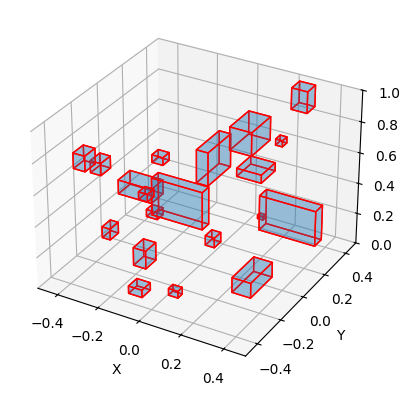

In [8]:
#task_1 = generate_tasks(1, 3)[0]
cuboid_data_list = plot_random_cuboids()
header = TaskHeader(
    ID='Random Obstacles Generation v: ' ,
    tags=['Capstone', 'demo'],
    date=datetime.datetime(2024, 10, 28),
    author=['Jonas Li, Jae Won Kim'],
    email=['liyunzhe.jonas@berkeley.edu, jaewon_kim@berkeley.edu'],
    affiliation=['UC Berkeley']
)

box = []
for idx, info in enumerate(cuboid_data_list):
    size, displacement = info["size"], info["origin"]
    box.append(Obstacle(ID=str(idx), 
                collision=Box(
                    dict(x=size['x'], y=size['y'], z=size['z']),  # Size
                    pose=Transformation.from_translation([displacement['x'] + size['x'] / 2, displacement['y'] + size['y'] / 2, displacement['z'] + size['z'] / 2])
                )))
task = Task(header, obstacles=[i for i in box])

In [9]:
# import importlib
# from reachability_parallel import Reachability, generate_tasks
# import ray
# import time
# # importlib.reload(Reachability)
# # importlib.reload(generate_tasks)
# # task = generate_tasks(1, 20)[0]
# reachability = Reachability(
#         robot_modules = modules, 
#         task = task_1,
#         db = db,
#         mass = 0,
#     )
    
# # Run parallel sampling with actors
# start_t = time.time()
# reachability.reachability_random_sample_actors(num_samples = 50000, num_actors = 4, batch_size = 1000)
# print(f"Time to find reachability: {time.time() - start_t} seconds")

# # Visualize and analyze results
# reachability.plot_reachability("reachability_plot_parallel.png")
# percentage = reachability.find_reachibility_percentage(voxel_size = 0.1)
# print(f"Percentage of reachability: {percentage}%")

# ray.shutdown()
# with open('db.pkl', 'wb') as f:
#     dill.dump(db_dict, f)

# init_pop = [('540_base', '540_base-to-540_joint-0.3-3-E', '540_joint', '540_joint-to-540_joint-0.45-3-E', '540_joint', '540_joint-to-540_joint-0.3-1-S', '540_joint', '540_joint-to-540_joint-0.15-2-E', '540_joint', '540_joint-to-330_joint-0.45-3-N', '330_joint', '330_joint-to-330_joint-0.15-3-W', '330_joint', '330_joint-to-330_joint-0.15-2-S', '330_joint', 'eef'), ('540_base', '540_base-to-540_joint-0.3-2-N', '540_joint', '540_joint-to-540_joint-0.15-2-S', '540_joint', '540_joint-to-330_joint-0.45-1-E', '330_joint', '330_joint-to-330_joint-0.45-3-W', '330_joint', '330_joint-to-540_joint-0.15-3-W', '540_joint', '540_joint-to-540_joint-0.15-2-S', '540_joint', '540_joint-to-540_joint-0.15-2-S', '540_joint', 'eef'), ('540_base', '540_base-to-540_joint-0.15-3-E', '540_joint', '540_base-to-540_joint-0.15-3-E', '330_joint', '330_joint-to-330_joint-0.45-1-S', '330_joint', '330_joint-to-330_joint-0.45-1-S', '330_joint', '330_joint-to-540_joint-0.3-3-W', '540_joint', '540_joint-to-540_joint-0.3-0-E', '540_joint', '540_joint-to-540_joint-0.45-3-N', '540_joint', 'eef'), ('540_base', '540_base-to-330_joint-0.45-3-N', '330_joint', '330_joint-to-330_joint-0.15-0-S', '330_joint', '330_joint-to-330_joint-0.15-0-S', '540_joint', '540_joint-to-540_joint-0.15-3-N', '540_joint', '540_joint-to-330_joint-0.45-2-W', '330_joint', '330_joint-to-540_joint-0.3-1-S', '540_joint', '540_joint-to-330_joint-0.3-3-W', '330_joint', 'eef'), ('540_base', '540_base-to-540_joint-0.15-2-S', '540_joint', '540_base-to-540_joint-0.15-2-S', '540_joint', '540_base-to-540_joint-0.15-2-S', '330_joint', '330_joint-to-330_joint-0.3-3-S', '330_joint', '330_joint-to-540_joint-0.45-0-N', '540_joint', '540_joint-to-540_joint-0.15-0-E', '540_joint', '540_joint-to-330_joint-0.3-1-N', '330_joint', 'eef'), ('540_base', '540_base-to-540_joint-0.15-1-W', '540_joint', '540_joint-to-540_joint-0.3-0-E', '540_joint', '540_joint-to-540_joint-0.45-2-W', '540_joint', '540_joint-to-540_joint-0.15-3-E', '540_joint', '540_joint-to-330_joint-0.15-0-N', '330_joint', '330_joint-to-540_joint-0.3-3-E', '540_joint', '540_joint-to-540_joint-0.3-1-S', '540_joint', 'eef'), ('540_base', '540_base-to-330_joint-0.3-0-N', '330_joint', '330_joint-to-330_joint-0.15-1-W', '330_joint', '330_joint-to-540_joint-0.15-1-S', '540_joint', '540_joint-to-330_joint-0.15-2-N', '330_joint', '330_joint-to-540_joint-0.15-1-S', '540_joint', '330_joint-to-540_joint-0.15-1-S', '330_joint', '330_joint-to-540_joint-0.15-0-W', '540_joint', 'eef'), ('540_base', '540_joint-to-330_joint-0.3-0-E', '540_joint', '540_joint-to-330_joint-0.3-0-E', '540_joint', '540_joint-to-540_joint-0.3-3-E', '540_joint', '540_joint-to-330_joint-0.45-0-E', '330_joint', '330_joint-to-540_joint-0.45-3-N', '540_joint', '540_joint-to-540_joint-0.45-3-S', '540_joint', '540_joint-to-540_joint-0.15-0-E', '540_joint', 'eef'), ('540_base', '540_base-to-330_joint-0.3-2-S', '330_joint', '330_joint-to-540_joint-0.45-3-S', '540_joint', '540_joint-to-330_joint-0.15-3-W', '330_joint', '330_joint-to-330_joint-0.3-2-E', '330_joint', '330_joint-to-330_joint-0.3-2-E', '330_joint', '330_joint-to-330_joint-0.3-2-W', '330_joint', '330_joint-to-330_joint-0.3-2-W', '330_joint', 'eef'), ('540_base', '540_base-to-540_joint-0.3-1-W', '540_joint', '540_joint-to-540_joint-0.3-2-E', '540_joint', '540_joint-to-540_joint-0.3-2-N', '540_joint', '540_joint-to-540_joint-0.3-2-N', '330_joint', '330_joint-to-330_joint-0.45-2-W', '330_joint', '330_joint-to-330_joint-0.3-3-S', '330_joint', '330_joint-to-540_joint-0.15-2-E', '540_joint', 'eef')]
# result = []
# for pop in init_pop:
#     C = ModuleAssembly.from_serial_modules(db, modules)
#     result.append(fitness_function(C, None, None))
#     print(result[-1])
# 100, 98.5, 99.4
# 97.7 99.5 97.9

In [27]:
#reachability.plot_reachability("reachability_plot.png")
modules = ('540_base', '540_base-to-540_joint-0.1-1-N', '540_joint', '540_joint-to-430_joint-0.15-0-W', '430_joint', '430_joint-to-330_joint-0.1-2-S', '330_joint', '330_joint-to-430_joint-0.15-0-E', '430_joint', '430_joint-to-430_joint-0.1-2-E', '430_joint', '430_joint-to-430_joint-0.3-2-W', 'eef')
modules = ('540_base', '540_base-to-430_joint-0.1-0-W', '430_joint', '430_joint-to-540_joint-0.1-0-S', '540_joint', '540_joint-to-540_joint-0.2-0-E', '540_joint', '540_joint-to-330_joint-0.1-3-W', '330_joint', '330_joint-to-540_joint-0.1-0-N', '540_joint', '540_joint-to-540_joint-0.3-0-N', 'eef')
modules = ('540_base', '540_base-to-330_joint-0.1-1-N', '330_joint', '330_joint-to-430_joint-0.15-0-W', '430_joint', '430_joint-to-330_joint-0.1-2-S', '330_joint', '330_joint-to-430_joint-0.15-0-E', '430_joint', '430_joint-to-430_joint-0.1-2-E', '430_joint', '430_joint-to-430_joint-0.3-2-W', 'eef')
O = ModuleAssembly.from_serial_modules(db, modules)

robot_optimal = O.to_pin_robot()

from reachability_with_weight import Reachability_with_weight
reachability_with_weight = Reachability_with_weight(
        robot=robot_optimal,
        task = task,
    )
valid_positions = reachability_with_weight.reachability_random_sample(num_samples = 20000, mass=5)
reachable = np.array([list(pt) for pt in valid_positions])
reachability_score = reachability_with_weight.find_reachibility_percentage(valid_pose=reachable, voxel_size=0.1)
print(reachability_score)


10.7


In [23]:
for joint in db.all_joints:
    print(joint._id, joint.torque_limit, joint.motor_inertia)
for id, module in db.by_id.items():
    print(id, module.mass)

330_joint 0.93 0.0
540_joint 10.6 0.0
540_base 10.6 0.0
430_joint 3.4 0.0
540_joint-to-540_joint-0.1-2-S 0.01013
540_base-to-330_joint-0.2-1-N 0.02026
540_joint-to-430_joint-0.3-2-N 0.03039
540_base-to-430_joint-0.2-0-W 0.02026
540_joint-to-540_joint-0.15-3-S 0.015195
540_joint-to-430_joint-0.2-0-E 0.02026
540_base-to-330_joint-0.3-0-S 0.03039
430_joint-to-430_joint-0.1-2-W 0.01013
540_base-to-430_joint-0.1-1-W 0.01013
330_joint-to-430_joint-0.15-3-S 0.015195
430_joint-to-430_joint-0.1-1-S 0.01013
330_joint-to-330_joint-0.1-3-E 0.01013
430_joint-to-540_joint-0.3-1-W 0.03039
330_joint-to-540_joint-0.15-2-S 0.015195
540_base-to-540_joint-0.1-0-S 0.01013
330_joint-to-330_joint-0.15-1-S 0.015195
330_joint-to-430_joint-0.1-3-S 0.01013
540_base-to-430_joint-0.15-1-E 0.015195
430_joint-to-430_joint-0.15-2-S 0.015195
430_joint-to-430_joint-0.2-0-W 0.02026
540_base-to-330_joint-0.1-1-E 0.01013
baseto430_2-0.3 0.03039
330_joint-to-540_joint-0.1-2-W 0.01013
540_base-to-540_joint-0.3-0-N 0.03039
4

In [130]:
project_root = os.path.abspath(os.path.join(os.getcwd(), '../'))
sys.path.append(project_root)

from random_env_generation.random_env_generation import plot_random_cuboids, plot_random_cuboids_with_reachability, plot_reachability_interactive
cuboids = [{'size': {'x': 0.09136655129295881, 'y': 0.21687406448016755, 'z': 0.15854087533255506}, 'origin': {'x': 0.31182506725030845, 'y': -0.09912513162943137, 'z': 0.6558389584526416}}
,{'size': {'x': 0.13282183008218387, 'y': 0.10550082218933937, 'z': 0.13071384192581811}, 'origin': {'x': -0.4499779583926464, 'y': -0.0926805365049107, 'z': 0.25930854765730577}}
,{'size': {'x': 0.29323049154761577, 'y': 0.31953877826735133, 'z': 0.21239615396453596}, 'origin': {'x': -0.1958052714427872, 'y': -0.41544653161566475, 'z': 0.2712070035596496}}
]
print(list(valid_positions))
plot_random_cuboids_with_reachability(cuboid_data_list, list(valid_positions), [])

[(0.154, -0.128, 0.812), (-0.295, 0.035, 0.561), (0.106, -0.459, 0.323), (0.054, -0.388, 0.516), (0.111, -0.131, 0.837), (0.246, -0.182, 0.423), (-0.527, 0.21, 0.089), (-0.303, -0.236, 0.484), (0.148, -0.148, -0.388), (0.381, 0.088, 0.609), (0.149, -0.09, 0.123), (0.009, -0.571, 0.508), (-0.271, -0.203, 0.021), (0.022, -0.243, -0.374), (-0.198, 0.085, 0.167), (-0.056, -0.332, -0.112), (0.461, -0.108, 0.523), (-0.137, 0.157, -0.042), (0.395, 0.281, 0.535), (0.137, -0.566, 0.074), (0.019, -0.446, 0.381), (0.367, 0.228, -0.153), (0.22, 0.395, -0.057), (0.423, 0.166, 0.458), (-0.076, -0.564, -0.188), (-0.22, -0.311, 0.277), (0.059, -0.64, 0.33), (-0.01, -0.103, 0.214), (0.039, -0.158, 0.159), (-0.152, 0.288, -0.177), (-0.31, -0.155, -0.232), (-0.036, 0.129, 0.15), (0.444, 0.118, 0.102), (0.267, -0.07, -0.449), (-0.144, 0.044, -0.487), (-0.012, -0.213, 0.056), (-0.001, -0.342, 0.747), (0.003, -0.388, 0.6), (0.085, 0.384, 0.093), (-0.32, -0.12, 0.189), (0.435, -0.232, -0.152), (-0.039, -0.18

(array([[ 0.154, -0.128,  0.812],
        [-0.295,  0.035,  0.561],
        [ 0.106, -0.459,  0.323],
        ...,
        [-0.174, -0.412, -0.392],
        [ 0.121,  0.312, -0.376],
        [-0.12 , -0.183,  0.626]]),
 [])

In [ ]:
modules = ('540_base', '540_base-to-540_joint-0.1-0-E', '540_joint', '540_joint-to-430_joint-0.15-2-W', '430_joint', '430_joint-to-540_joint-0.3-2-N', '540_joint', '540_joint-to-540_joint-0.15-3-E', '540_joint', '540_joint-to-540_joint-0.3-2-N', '540_joint', '540_joint-to-540_joint-0.15-1-E', 'eef')
modules2 = ('540_base', '540_base-to-540_joint-0.1-0-E', '540_joint', '540_joint-to-430_joint-0.15-2-W', '430_joint', '430_joint-to-540_joint-0.3-2-N', '540_joint', '540_joint-to-540_joint-0.15-3-E', '540_joint', '540_joint-to-540_joint-0.3-2-N', '540_joint', '540_joint-to-540_joint-0.15-1-E', 'eef')
# reachability = Reachability(
#         robot_modules = modules2, 
#         task = task,
#         db = db,
#     )
    
# # Run parallel sampling with actors
# start_t = time.time()
# reachability.reachability_random_sample_actors(num_samples = 50000, num_actors = 4, batch_size = 1000)
# print(f"Time to find reachability: {time.time() - start_t} seconds")

# # Visualize and analyze results
# reachability.plot_reachability("reachability_plot_parallel.png")
# percentage = reachability.find_reachibility_percentage(voxel_size = 0.1)
# print(f"Percentage of reachability: {percentage}%")

# ray.shutdown()
# 100, 97.7, 98.9
# 98.4, 98.1 99.0 97.3

2025-04-18 19:31:39,603	INFO worker.py:1852 -- Started a local Ray instance.
(ReachabilityWorker pid=197143) 2025-04-18 19:31:41,102 Timor INFO Loading custom configurations from /home/mscsim/.config/timor.config
(ReachabilityWorker pid=197143) 2025-04-18 19:31:41,108 Timor INFO Getting robot modrob-gen2.
(ReachabilityWorker pid=197143) 2025-04-18 19:31:41,108 Timor WARNING Could not fetch robot modrob-gen2 due to [Errno 17] File exists: '/home/mscsim/anaconda3/envs/timor-env/lib/python3.10/site-packages/cache/robots/modrob-gen2'.


Batch 1/13 complete. Found 464 valid poses.
Batch 2/13 complete. Found 479 valid poses.
Batch 3/13 complete. Found 494 valid poses.
Batch 4/13 complete. Found 480 valid poses.
Batch 5/13 complete. Found 475 valid poses.
Batch 6/13 complete. Found 471 valid poses.
Batch 7/13 complete. Found 474 valid poses.
Batch 8/13 complete. Found 492 valid poses.
Batch 9/13 complete. Found 468 valid poses.
Batch 10/13 complete. Found 497 valid poses.
Batch 11/13 complete. Found 487 valid poses.
Batch 12/13 complete. Found 465 valid poses.
Batch 13/13 complete. Found 486 valid poses.
Time to find reachability: 91.5924813747406 seconds
Reachability plot saved to reachability_plot_parallel.png
Percentage of reachability: 97.3%


(ReachabilityWorker pid=197153) 2025-04-18 19:31:41,365 Timor INFO Loading custom configurations from /home/mscsim/.config/timor.config [repeated 3x across cluster]
(ReachabilityWorker pid=197153) 2025-04-18 19:31:41,372 Timor INFO Getting robot modrob-gen2. [repeated 3x across cluster]
(ReachabilityWorker pid=197153) 2025-04-18 19:31:41,372 Timor WARNING Could not fetch robot modrob-gen2 due to [Errno 17] File exists: '/home/mscsim/anaconda3/envs/timor-env/lib/python3.10/site-packages/cache/robots/modrob-gen2'. [repeated 3x across cluster]


In [15]:
from timor.utilities.visualization import animation
q0 = np.zeros((robot.dof,))
print(robot.dof)
q1 = robot.random_configuration()
q2 = np.array([0, -2 * np.pi])#, np.pi/2, np.pi/2])# #33aaaaa

print(q1)
robot.update_configuration(q1)
print(robot.has_self_collision())
viz = robot.visualize()
#print(q1)

trajectory = np.linspace(q0, q1)
# print(trajectory)
animation(robot, trajectory, dt=.1)

6
[ 1.74443817 -4.14969564  4.5185371   4.84254834  6.24387179 -3.20099825]
False
You can open the visualizer by visiting the following URL:
http://127.0.0.1:7012/static/
You can open the visualizer by visiting the following URL:
http://127.0.0.1:7013/static/


In [9]:
from reachability import Reachability
from timor_ga import *

# modules = ('base_rev_joint', 'baseto4310-0.15', 'motor4310_rev_joint', 
#            'r4310to4310-0.15', 'motor4310_rev_joint', 'r4310to4310-0.15', 
#            'motor4310_rev_joint', 'eef')
# modules = ('base_rev_joint', 'baseto4310-0.15', 'motor4310_rev_joint', 
#            'r4310to4310-0.15', 'motor4310_rev_joint', 'r4310to4310-0.15', 
#            'motor4310_rev_joint', 'r4310to4305-0.15', 'motor4310_rev_joint', 'r4310to4305-0.15', 'motor4305_rev_joint')
# C = ModuleAssembly.from_serial_modules(db, modules)

# robot = C.to_pin_robot()

how_many_times_to_split_angle_range = 30
world_resolution = 0.01
world_dimension = [1.00, 1.00, 1.00]
num_threads = 5

reach = Reachability(robot)
reach.reachability_random_sample(num_samples = 100000)
valid_poses = reach.reachability_random_sample(num_samples = 100000)
print("Valid poses:" , valid_poses)
reachable, manipulability =  zip(*valid_poses)
reachable = np.array([list(pt) for pt in reachable])
reachability_score = reach.find_reachibility_percentage(valid_pose=reachable)
print(reachability_score)


TypeError: Reachability.__init__() missing 1 required positional argument: 'db'

In [ ]:
print(valid_poses[0])
print(len(valid_poses)/100000)
print(reachability_score)

((-0.26, 0.51, 0.5), 0.037495609639106614)
0.6987
100.0


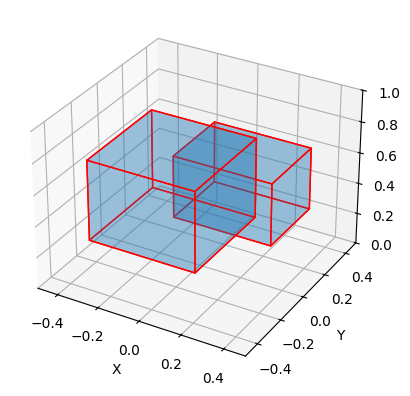

2
[<timor.task.Obstacle.Obstacle object at 0x767270b97700>, <timor.task.Obstacle.Obstacle object at 0x767270b94730>]
Cube data:  [{'size': {'x': 0.47909663141883296, 'y': 0.35783867549789894, 'z': 0.40487152976990776}, 'origin': {'x': -0.1971786500301041, 'y': 0.11429378766319098, 'z': 0.16375091129425456}}, {'size': {'x': 0.5, 'y': 0.5, 'z': 0.5}, 'origin': {'x': -0.24487164815101448, 'y': -0.4798323704746088, 'z': 0.40636791986989834}}]
You can open the visualizer by visiting the following URL:
http://127.0.0.1:7007/static/


In [ ]:
import datetime
import time
import sys
import os
import numpy as np
from timor.Geometry import Box, ComposedGeometry, Cylinder
from timor.task.Obstacle import Obstacle
from timor.task.Task import Task, TaskHeader
from timor.utilities.transformation import Transformation
from timor.utilities.spatial import rotX, rotY, rotZ

project_root = os.path.abspath(os.path.join(os.getcwd(), '../'))
sys.path.append(project_root)

from random_env_generation.random_env_generation import plot_random_cuboids, plot_random_cuboids_with_reachability, plot_reachability_interactive

cuboid_data_list = plot_random_cuboids(total_volume=0.03, space_size=(1.0, 1.0, 1.0), num_cuboids=2)

header = TaskHeader(
    ID='Random Obstacles Generation',
    tags=['Capstone', 'demo'],
    date=datetime.datetime(2024, 10, 28),
    author=['Jonas Li'],
    email=['liyunzhe.jonas@berkeley.edu'],
    affiliation=['UC Berkeley']
)

box = []
for idx, info in enumerate(cuboid_data_list):
    size, displacement = info["size"], info["origin"]
    box.append(Obstacle(ID=str(idx), 
                collision=Box(
                    dict(x=size['x'], y=size['y'], z=size['z']),  # Size
                    pose=Transformation.from_translation([displacement['x'] + size['x'] / 2, displacement['y'] + size['y'] / 2, displacement['z'] + size['z'] / 2])
                )))# Displacement
print(len(box))
print(box)
print("Cube data: ", cuboid_data_list)
task = Task(header, obstacles=[i for i in box])
task.visualize(robots=robot)

In [ ]:
obstacle_reachability = Reachability(robot, task=task)
valid_poses = obstacle_reachability.reachability_random_sample(num_samples = 100000)
print("Valid poses:" , valid_poses)
reachable, manipulability =  zip(*valid_poses)
reachable = np.array([list(pt) for pt in reachable])
reachability_score = obstacle_reachability.find_reachibility_percentage(valid_pose=reachable)
print(reachability_score)

Valid poses: [((0.12, 0.09, -0.34), 0.004125961230257063), ((0.65, -0.48, 0.07), 0.0035184722071608288), ((-0.03, -0.07, -0.33), 0.005520024697778574), ((-0.19, -0.3, -0.33), 0.01892750541112271), ((-0.42, -0.02, 0.1), 0.011483851540231063), ((0.55, 0.24, -0.2), 0.04268852577754511), ((-0.41, -0.27, 0.21), 0.013236650223241601), ((0.02, 0.09, -0.36), 0.0024664243278119603), ((-0.18, -0.31, -0.26), 0.027023218185142014), ((-0.59, 0.07, -0.25), 0.08906943002190103), ((0.3, 0.28, -0.09), 0.022727786213662466), ((0.06, -0.53, 0.1), 0.07990400460496175), ((-0.4, -0.13, 0.4), 0.0041920570212554305), ((0.4, -0.1, -0.41), 0.004622420686058018), ((0.15, 0.03, -0.12), 0.00310076559828733), ((0.22, -0.26, 0.23), 0.04088711555687412), ((0.92, 0.11, 0.35), 0.0009669965089760522), ((-0.32, -0.81, 0.75), 0.03600150555070779), ((-0.42, 0.16, 0.34), 0.003794976575990737), ((0.39, -0.29, -0.05), 0.03503215172346728), ((-0.6, 0.31, -0.13), 0.04007465843787211), ((-0.58, 0.24, 0.89), 0.09413750791642507),

In [ ]:
print(reachability_score)

99.8


In [ ]:
print(task.obstacles)
print([obstacle.collision.enclosing_volume.limit_rectangular_cuboid for obstacle in task.obstacles])
points1 = [task.obstacles[0].collision.enclosing_volume.sample_uniform() for i in range(1000)]
points2 = [task.obstacles[1].collision.enclosing_volume.sample_uniform() for i in range(1000)]
print(points2)
points = [(0,0,0), (0,-0.2,0), (0.2,-0.4,0), (0,0.3,0.4), (-0.1,-0.3,0.8)]
plot_random_cuboids_with_reachability(cuboid_data_list)

[<timor.task.Obstacle.Obstacle object at 0x767270b97700>, <timor.task.Obstacle.Obstacle object at 0x767270b94730>]
[array([[-0.23954832,  0.23954832],
       [-0.17891934,  0.17891934],
       [-0.20243576,  0.20243576]]), array([[-0.25,  0.25],
       [-0.25,  0.25],
       [-0.25,  0.25]])]
[array([ 0.07590415, -0.00687259,  0.14771666]), array([ 0.0321955 ,  0.11240631, -0.12870619]), array([-0.23488902,  0.06032609,  0.07014132]), array([-0.00767519,  0.18402851, -0.12377043]), array([0.15296596, 0.17325711, 0.22442589]), array([-0.01908767, -0.24819656, -0.044589  ]), array([ 0.0574322 , -0.03413589,  0.22227033]), array([ 0.09195647, -0.13000756, -0.17520535]), array([-0.20749931,  0.11412346,  0.19202791]), array([0.15909332, 0.07914822, 0.17488425]), array([-0.17851697, -0.07076612,  0.24580946]), array([0.23816353, 0.24137777, 0.06138166]), array([-0.11394898, -0.10494307, -0.14704368]), array([ 0.03818471,  0.20543229, -0.07461772]), array([-0.01229151, -0.21303414,  0.226440

([], [])

In [ ]:
def is_in_obstacle(cuboid_list, point):
    x, y, z = point
    for cuboid in cuboid_list:
        minx, miny, minz = cuboid["origin"]["x"], cuboid["origin"]["y"], cuboid["origin"]["z"]
        maxx, maxy, maxz = minx + cuboid["size"]["x"], miny + cuboid["size"]["y"], minz + cuboid["size"]["z"]

        if minx <= x <= maxx and miny <= y <= maxy and minz <= z <= maxz:
            return True

    return False 


In [ ]:
print(is_in_obstacle(cuboid_data_list, (0,0,0)))
print(is_in_obstacle(cuboid_data_list, (0,-0.2,0)))
print(is_in_obstacle(cuboid_data_list, (0.2,-0.4,0)))
print(is_in_obstacle(cuboid_data_list, (0,0.3,0.4)))
print(is_in_obstacle(cuboid_data_list, (-0.1,-0.3,0.8)))


False
False
False
True
True
